In [1]:
pip install -q git+https://github.com/tensorflow/docs

Note: you may need to restart the kernel to use updated packages.


In [2]:
import glob
import pandas as pd
import cv2
import gc
import numpy as np
import random
import imageio
import tensorflow as tf
from sklearn.model_selection import train_test_split
from tqdm.notebook import tqdm
from tensorflow_docs.vis import embed
import matplotlib.pyplot as plt
import os

2023-06-15 12:13:52.749497: I tensorflow/tsl/cuda/cudart_stub.cc:28] Could not find cuda drivers on your machine, GPU will not be used.
2023-06-15 12:13:53.904017: I tensorflow/tsl/cuda/cudart_stub.cc:28] Could not find cuda drivers on your machine, GPU will not be used.
2023-06-15 12:13:53.910195: I tensorflow/core/platform/cpu_feature_guard.cc:182] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 AVX512F FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.
2023-06-15 12:13:57.372711: W tensorflow/compiler/tf2tensorrt/utils/py_utils.cc:38] TF-TRT Warning: Could not find TensorRT


In [3]:
all_classes_names = os.listdir('/home/system6-user1/UCF101')
all_classes_names

['CleanAndJerk',
 'VolleyballSpiking',
 'Billiards',
 'BreastStroke',
 'TaiChi',
 'PlayingGuitar',
 'BlowingCandles',
 'ThrowDiscus',
 'Biking',
 'HorseRiding',
 'Skijet',
 'Diving',
 'BalanceBeam',
 'WallPushups',
 'HorseRace',
 'Hammering',
 'PlayingFlute',
 'RockClimbingIndoor',
 'UnevenBars',
 'HighJump',
 'YoYo',
 'MilitaryParade',
 'Rowing',
 'TennisSwing',
 'SalsaSpin',
 'BaseballPitch',
 'BabyCrawling',
 'BoxingSpeedBag',
 'StillRings',
 'Basketball',
 'PlayingSitar',
 'HulaHoop',
 'Drumming',
 'BoxingPunchingBag',
 'WritingOnBoard',
 'JumpingJack',
 'JugglingBalls',
 'Skiing',
 'Nunchucks',
 'BlowDryHair',
 'BandMarching',
 'Haircut',
 'WalkingWithDog',
 'BrushingTeeth',
 'Rafting',
 'SoccerPenalty',
 'FloorGymnastics',
 'HandstandWalking',
 'Knitting',
 'Fencing',
 'GolfSwing',
 'PushUps',
 'Mixing',
 'FieldHockeyPenalty',
 'ParallelBars',
 'CliffDiving',
 'PlayingPiano',
 'SkateBoarding',
 'HandstandPushups',
 'PommelHorse',
 'CuttingInKitchen',
 'Punch',
 'Shotput',
 'Crick

In [4]:
pip install keras-video-generators

Note: you may need to restart the kernel to use updated packages.


In [5]:
from keras_video import VideoFrameGenerator

In [6]:
class Video_Param:
    epochs = 15
    batch_size = 32
    SIZE = (224, 224)
    CHANNELS = 3
    FRAMES = 10
    classes = all_classes_names#['PlayingPiano', 'HighJump', 'Skiing']#, 'PushUps', 'Diving']

In [7]:
glob_pattern='/home/system6-user1/UCF101/{classname}/**.avi'

In [17]:
train = VideoFrameGenerator(
    classes=Video_Param.classes,
    glob_pattern=glob_pattern,
    nb_frames=Video_Param.FRAMES,
    split_val=.25,
    split_test = 0.3,
    shuffle=True,
    batch_size=Video_Param.batch_size,
    target_shape=Video_Param.SIZE,
    nb_channel=Video_Param.CHANNELS,
    transformation=None,
    use_frame_cache=True)

class ApplyEyeMakeup, validation count: 36, test count: 32, train count: 77
class ApplyLipstick, validation count: 28, test count: 25, train count: 61
class Archery, validation count: 36, test count: 32, train count: 77
class BabyCrawling, validation count: 33, test count: 29, train count: 70
class BalanceBeam, validation count: 27, test count: 24, train count: 57
class BandMarching, validation count: 38, test count: 35, train count: 82
class BaseballPitch, validation count: 37, test count: 33, train count: 80
class Basketball, validation count: 33, test count: 30, train count: 71
class BasketballDunk, validation count: 32, test count: 29, train count: 70
class BenchPress, validation count: 40, test count: 36, train count: 84
class Biking, validation count: 33, test count: 30, train count: 71
class Billiards, validation count: 37, test count: 33, train count: 80
class BlowDryHair, validation count: 32, test count: 29, train count: 70
class BlowingCandles, validation count: 27, test cou

In [18]:
valid = train.get_validation_generator()

Total data: 101 classes for 3293 files for validation


In [19]:
test = train.get_test_generator()

Total data: 101 classes for 2957 files for test


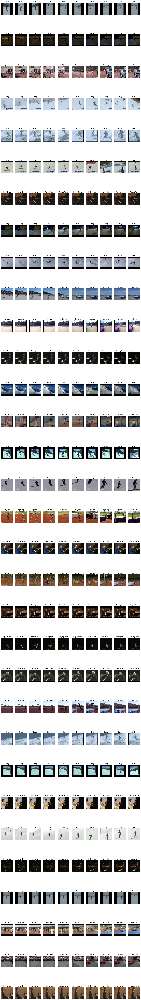

In [ ]:
import keras_video.utils
keras_video.utils.show_sample(train)

In [10]:
from tensorflow.keras.layers import Layer, MultiHeadAttention, Dense, LayerNormalization

class TransformerLayer(Layer):
    def __init__(self, num_heads, feed_forward_dim, dropout_rate=0.2, **kwargs):
        super(TransformerLayer, self).__init__(**kwargs)
        self.num_heads = num_heads
        self.feed_forward_dim = feed_forward_dim
        self.dropout_rate = dropout_rate

    def build(self, input_shape):
        self.attention = MultiHeadAttention(num_heads=self.num_heads, key_dim=input_shape[-1])
        self.attention_dropout = Dropout(self.dropout_rate)
        self.attention_layer_norm = LayerNormalization(epsilon=1e-6)
        self.feed_forward = Sequential(
            [Dense(self.feed_forward_dim, activation="relu"), Dense(input_shape[-1])]
        )
        self.feed_forward_dropout = Dropout(self.dropout_rate)
        self.feed_forward_layer_norm = LayerNormalization(epsilon=1e-6)
        super(TransformerLayer, self).build(input_shape)

    def call(self, inputs, training=True):
        attention_output = self.attention(inputs, inputs)
        attention_output = self.attention_dropout(attention_output)
        attention_output = self.attention_layer_norm(inputs + attention_output)

        feed_forward_output = self.feed_forward(attention_output)
        feed_forward_output = self.feed_forward_dropout(feed_forward_output)
        output = self.feed_forward_layer_norm(attention_output + feed_forward_output)
        return output

    def get_config(self):
        config = super(TransformerLayer, self).get_config()
        config.update(
            {
                "num_heads": self.num_heads,
                "feed_forward_dim": self.feed_forward_dim,
                "dropout_rate": self.dropout_rate,
            }
        )
        return config

In [12]:
net = tf.keras.applications.EfficientNetB0(include_top = False)
net.trainable = False

2023-06-15 12:34:38.553105: W tensorflow/core/common_runtime/gpu/gpu_device.cc:1956] Cannot dlopen some GPU libraries. Please make sure the missing libraries mentioned above are installed properly if you would like to use GPU. Follow the guide at https://www.tensorflow.org/install/gpu for how to download and setup the required libraries for your platform.
Skipping registering GPU devices...


In [8]:
from keras import Sequential, Model, models
from keras.layers import Flatten, LSTM, Reshape, Dense, BatchNormalization, Activation,Dropout, Bidirectional, TimeDistributed, GlobalAveragePooling3D
from keras.api._v2.keras import Input
from keras.layers.pooling.global_max_pooling3d import GlobalMaxPooling3D
from keras.layers.preprocessing.image_preprocessing import Rescaling

In [13]:

input_shape = (10, 224, 224, 3)
input_layer = Input(shape=input_shape)
rescal_layer = Rescaling(255.0)(input_layer)
feature_extractor = TimeDistributed(net)(rescal_layer)
flatten_layer = TimeDistributed(Flatten())(feature_extractor)
bi_lstm = Bidirectional(LSTM(64, return_sequences=True))(flatten_layer)

# Transformer layer
transformer_layer = TransformerLayer(
    num_heads=4,
    feed_forward_dim=128,
)(bi_lstm)
# global_layer = GlobalAveragePooling3D()(flatten_layer)
flatten_layer = Flatten()(transformer_layer)
# Output layer
dense_layer = Dense(256, activation='relu')(flatten_layer)
output_layer = Dense(len(Video_Param.classes), activation='softmax')(dense_layer)

model = Model(inputs=input_layer, outputs=output_layer)

2023-06-15 12:34:46.916662: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-15 12:34:46.921560: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_grad/concat/split/split_dim' with dtype int32
	 [[{{node gradients/split_grad/concat/split/split_dim}}]]
2023-06-15 12:34:46.924964: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You mus

In [22]:
model.compile(optimizer = 'adam',
              loss=tf.keras.losses.CategoricalCrossentropy(),
              metrics=['accuracy'])

In [24]:
# history = model.fit(
#     train_features, train_targets,
#     epochs = 10,
#     batch_size = 32
#   )

model.fit_generator(
    train,
    validation_data=valid,
    verbose=1,
    epochs=Video_Param.epochs,
    callbacks= [
        tf.keras.callbacks.EarlyStopping(patience = 2, monitor = 'val_loss'),
        tf.keras.callbacks.ModelCheckpoint(
            "efficient_net_model_new.h5",
            monitor="val_accuracy",
            mode="max",
            save_best_only=True,
            save_weights_only=True
        )
    ]
)


/tmp/ipykernel_926091/3096096966.py:7: UserWarning: `Model.fit_generator` is deprecated and will be removed in a future version. Please use `Model.fit`, which supports generators.
  model.fit_generator(


Epoch 1/15


2023-06-14 16:06:31.504973: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_0' with dtype int32
	 [[{{node Placeholder/_0}}]]
2023-06-14 16:06:33.133043: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-14 16:06:33.134577: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_gra

220/220 [==============================] - ETA: 0s - loss: 2.4463 - accuracy: 0.4047

2023-06-14 16:30:57.839703: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_0' with dtype int32
	 [[{{node Placeholder/_0}}]]
2023-06-14 16:31:00.401517: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-14 16:31:00.403579: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_gra

220/220 [==============================] - 2155s 10s/step - loss: 2.4463 - accuracy: 0.4047 - val_loss: 1.3172 - val_accuracy: 0.6281
Epoch 2/15
220/220 [==============================] - 4854s 22s/step - loss: 0.8705 - accuracy: 0.7470 - val_loss: 0.8300 - val_accuracy: 0.7748
Epoch 3/15
220/220 [==============================] - 4440s 20s/step - loss: 0.4751 - accuracy: 0.8568 - val_loss: 0.8575 - val_accuracy: 0.7708
Epoch 4/15
220/220 [==============================] - 4347s 20s/step - loss: 0.3092 - accuracy: 0.9006 - val_loss: 0.7330 - val_accuracy: 0.8174
Epoch 5/15
220/220 [==============================] - 4421s 20s/step - loss: 0.2380 - accuracy: 0.9280 - val_loss: 0.8267 - val_accuracy: 0.8058
Epoch 6/15
220/220 [==============================] - 4741s 22s/step - loss: 0.2328 - accuracy: 0.9251 - val_loss: 0.7066 - val_accuracy: 0.8447
Epoch 7/15
220/220 [==============================] - 5058s 23s/step - loss: 0.1804 - accuracy: 0.9443 - val_loss: 0.8529 - val_accuracy: 0.8

In [14]:
model.load_weights("/home/system6-user1/vctl/efficient_net_model_new.h5")
# model_data = models.load_model('/home/system6-user1/vctl/efficient_net_model_new.h5')

In [20]:
pred=model.predict_generator(test, steps=len(test), verbose=1)

/tmp/ipykernel_1109846/3137382495.py:1: UserWarning: `Model.predict_generator` is deprecated and will be removed in a future version. Please use `Model.predict`, which supports generators.
  pred=model.predict_generator(test, steps=len(test), verbose=1)
2023-06-15 12:50:14.771804: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_0' with dtype int32
	 [[{{node Placeholder/_0}}]]
2023-06-15 12:50:16.514336: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-15 12:50:16.516005: 

92/92 [==============================] - 507s 5s/step


In [23]:
scores = model.evaluate(test)
print("evaluate_generator "+ str(scores[1]*100))

2023-06-15 14:22:15.798719: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_0' with dtype int32
	 [[{{node Placeholder/_0}}]]
2023-06-15 14:22:17.336707: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_2_grad/concat/split_2/split_dim' with dtype int32
	 [[{{node gradients/split_2_grad/concat/split_2/split_dim}}]]
2023-06-15 14:22:17.338576: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'gradients/split_gra

92/92 [==============================] - 510s 5s/step - loss: 0.4231 - accuracy: 0.8971
evaluate_generator 89.7078812122345
